In [1]:
import h5py
from dataloader import DataSet
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from glob import glob
from osgeo import gdal
from model import Nowcast
from unet import UNet

In [22]:
date='20170826'
before, after=DataSet(event=date)[20]

In [23]:
def normalizer(x):
	'''input tensor size (b,tsize,c,m,n), Apply log transform to data
		See Casper et al. 2020 MetNet
	'''
	log_transform= torch.log10(x+0.01)/4
	tangent_transform= torch.tanh(log_transform)

	return tangent_transform 

In [24]:
before_process= normalizer(before)


In [17]:
'''
In this folder, we build LSTM model for radar nowcast.
'''

import torch
import torch.nn as nn
from torch.autograd import Variable

class DoubleConv(nn.Module):
    def __init__(self, in_channels,hidden_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.doubleConv= nn.Sequential(
                        nn.Conv2d(in_channels, hidden_channels, 3,1,1),
                        nn.BatchNorm2d(hidden_channels),
                        nn.LeakyReLU(True),
                        nn.Conv2d(hidden_channels, out_channels, 3,1,1),
                        nn.BatchNorm2d(out_channels),
                        nn.LeakyReLU(True),
                )
    def forward(self, x):
        out= self.doubleConv(x)
        
        return out

class BaseNet(nn.Module):

	def __init__(self, input_channels, hidden_channels, kernel_size, bias=True, use_gpu=False):
		super(BaseNet,self).__init__()
		self.input_channels= input_channels
		self.hidden_channels= hidden_channels
		self.kernel_size= kernel_size
		self.bias= bias
		self.use_gpu= use_gpu

		assert self.hidden_channels%2==0

		self.num_features=4
		self.padding = int((kernel_size-1)/2) #'same'

		# assign weights
		self.Wxi= nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Whi= nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Wxf= nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Whf= nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Wxc= nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Whc= nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Wxo= nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)
		self.Who= nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size,1,self.padding,bias=True)

		self.Wci= None
		self.Wcf= None

	def forward(self, x, h, c):

		ci= torch.sigmoid(self.Wxi(x)+ self.Whi(h)+ c* self.Wci)
		cf= torch.sigmoid(self.Wxf(x)+ self.Whf(h)+ c* self.Wcf)
		cc= cf* c+ ci* torch.tanh(self.Wxc(x)+ self.Whc(h))
		co= torch.sigmoid(self.Wxo(x)+ self.Who(h)+ cc*self.Wco)
		ch= co* torch.tanh(cc)

		return ch, cc

	def init_hidden(self, batch_size,hidden, shape):
		if self.use_gpu:
			self.Wci= Variable(torch.zeros(1,hidden,shape[0],shape[1])).cuda()
			self.Wcf= Variable(torch.zeros(1,hidden,shape[0],shape[1])).cuda()
			self.Wco= Variable(torch.zeros(1,hidden,shape[0],shape[1])).cuda()

			return (Variable(torch.zeros(batch_size, hidden, shape[0], shape[1])).cuda(),
					Variable(torch.zeros(batch_size, hidden, shape[0], shape[1]).cuda()))

		else: #gpu is not available
			self.Wci= Variable(torch.zeros(1,hidden,shape[0],shape[1]))
			self.Wcf= Variable(torch.zeros(1,hidden,shape[0],shape[1]))
			self.Wco= Variable(torch.zeros(1,hidden,shape[0],shape[1]))

			return (Variable(torch.zeros(batch_size,hidden, shape[0], shape[1])),
					Variable(torch.zeros(batch_size,hidden, shape[0], shape[1])))


class RadarNet(nn.Module):
	# Encoder-Predictor with BaseNet
	def __init__(self, input_channels=1, hidden_channels=16, kernel_size=3,
				bias=True, use_gpu=True):

		super(RadarNet, self).__init__()
		self.input_channels= input_channels
		self.hidden_channels= hidden_channels
		self.kernel_size= kernel_size
		self.bias= bias
		self.use_gpu= use_gpu

		self.encoder= BaseNet(self.input_channels, self.hidden_channels, self.kernel_size, self.bias, self.use_gpu)
		
		self.predictor= BaseNet(self.input_channels, self.hidden_channels, self.kernel_size, self.bias, self.use_gpu)

		self.padding= int((self.kernel_size-1)/2)
		self.lastconv= nn.Conv2d(self.hidden_channels, self.input_channels, self.kernel_size, 1, self.padding, bias=True)

	def forward(self, input):
		x= input

		tsize= x.size()[1]



		bsize, tsize, channels, height, width= x.size()

		(he, ce)= self.encoder.init_hidden(batch_size=bsize, hidden=self.hidden_channels, shape=(height, width))
		(hp, cp)= self.predictor.init_hidden(batch_size=bsize, hidden=self.hidden_channels, shape=(height, width))
		#encoding
		for it in range(tsize):
			(he, ce)= self.encoder(x[:,it,:,:,:], he, ce)

		hp= he
		cp= ce

		#predictor
		xzero= Variable(torch.zeros(bsize,channels, height, width)).cuda() if self.use_gpu else Variable(torch.zeros(bsize, channels,height, width))
		xout= Variable(torch.zeros(bsize, tsize, channels, height, width)).cuda() if self.use_gpu else Variable(torch.zeros(bsize, tsize, channels,height, width))

		for it in range(tsize):
			(hp, cp)= self.predictor(xzero, hp, cp)
			xout[:,it,:,:,:]= self.lastconv(hp)

		return xout


class Nowcast(nn.Module):
	def __init__(self, input_channels=1, hidden_channels=16, kernel_size=3,
				bias=True, use_gpu=True):

				super(Nowcast, self).__init__()

				self.radarnet= RadarNet(input_channels=input_channels, hidden_channels=hidden_channels, kernel_size=3,
				bias=True, use_gpu=True)

				self.upsample= nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
                                             DoubleConv(input_channels, 16, 1))
				self.downsample= nn.Sequential(nn.MaxPool2d(2),DoubleConv(input_channels, 16,1))

				# self.pipeline= nn.Sequential(
				# 		# nn.BatchNorm2d(16),
				# 		self.downsample,
				# 		self.radarnet,
				# 		# nn.BatchNorm2d(16),
				# 		nn.LeakyReLU(),
				# 		self.upsample
						
				# )

	def forward(self,x):

		bsize, tsize, channels, height, width= x.size()
		y= torch.zeros((bsize,tsize,channels,height//2,width//2)).cuda()
# 		for it in range(tsize):
# 			y[:,it,:,:,:]= self.downsample(self.downsample(x[:,it,:,:,:]))

# 		x=self.downsample(x)
		x=self.radarnet(x)
		# print(y.size())

# 		for it in range(tsize):
# 			x[:,it,:,:,:]= self.upsample(self.upsample(y[:,it,:,:,:]))
		# print(x)
		# x=self.upsample(x)
		# print(x)

		
		return x

In [18]:
# model= Nowcast()
model= UNet()
best_model_pth= '/home/allen/Documents/Projects/Nowcast/logging/net_epoch91.pth'
model.load_state_dict((torch.load(best_model_pth, map_location='cpu')))
model.cuda()
model.eval()

UNet(
  (inc): DoubleConv(
    (doubleConv): Sequential(
      (0): Conv2d(10, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): DownSample(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (doubleConv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, m

In [25]:
pred= model(before_process.view(1,10,648,800).cuda())

In [26]:
output= pred.detach().cpu().numpy()

In [10]:
fig,ax=plt.subplots(10,2,figsize=(8,40))
for i in range(10):
    ax[i,0].imshow(output.squeeze()[i])
    ax[i,1].imshow(after.numpy().squeeze()[i])

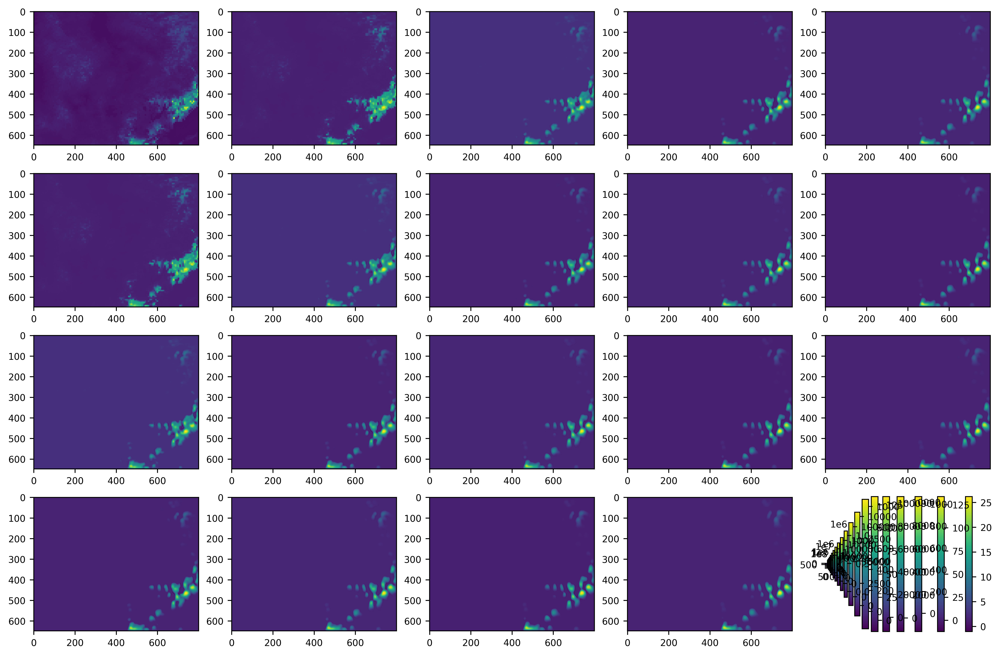

In [23]:
fig,ax=plt.subplots(4,5,figsize=(15,10))
for i in range(4):
    to_be_predicted= before_process.view(1,10,648,800).cuda()
    pred= model(to_be_predicted).detach().cpu()
    cax= ax[i,0].imshow(before_process.numpy().squeeze()[-4])
    plt.colorbar(mappable=cax)
    cax= ax[i,1].imshow(before_process.numpy().squeeze()[-3])
    plt.colorbar(mappable=cax)
    cax=ax[i,2].imshow(before_process.numpy().squeeze()[-2])
    plt.colorbar(mappable=cax)
    cax=ax[i,3].imshow(before_process.numpy().squeeze()[-1])
    plt.colorbar(mappable=cax)
    cax=ax[i,4].imshow(pred.numpy().squeeze())
    plt.colorbar(mappable=cax)
    before_process[0:-1,:,:]= before_process[1:,:,:].clone()
    before_process[-1]=pred
    

In [26]:
fig,ax=plt.subplots(4,3,figsize=(15,20))
for i in range(4):
    axes= ax[i,0].imshow(after.numpy().squeeze()[i])
#     plt.colorbar(mappable=axes)
    axes=ax[i,1].imshow(output.squeeze())
#     plt.colorbar(mappable=axes)
    axes=ax[i,2].imshow(before.numpy().squeeze()[-1])
#     plt.colorbar(mappable=axes)

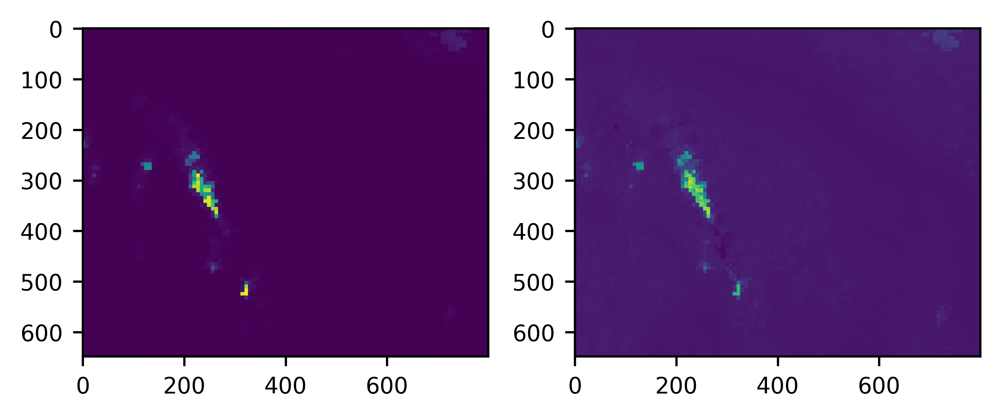

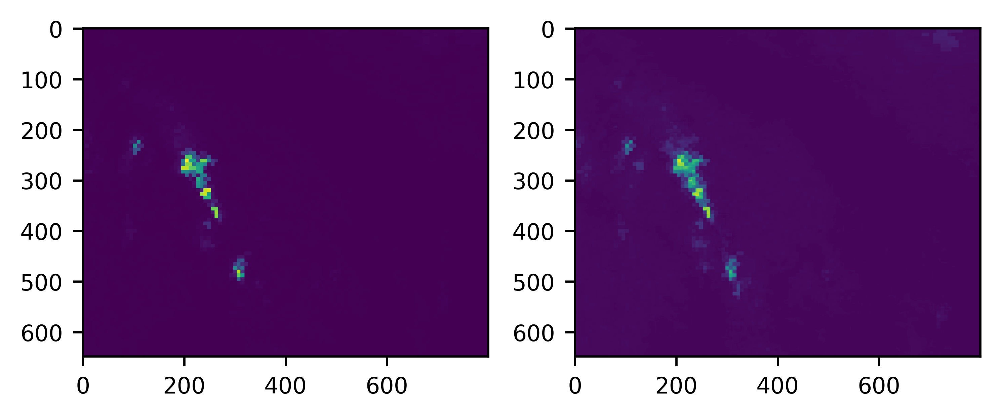

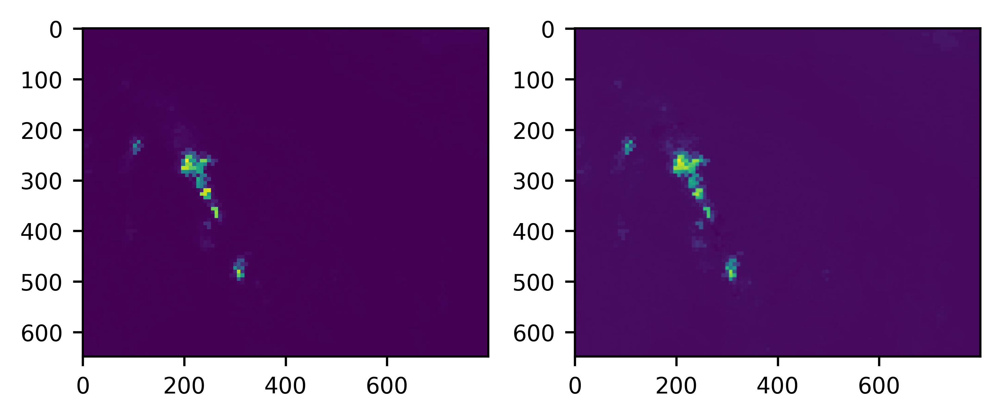

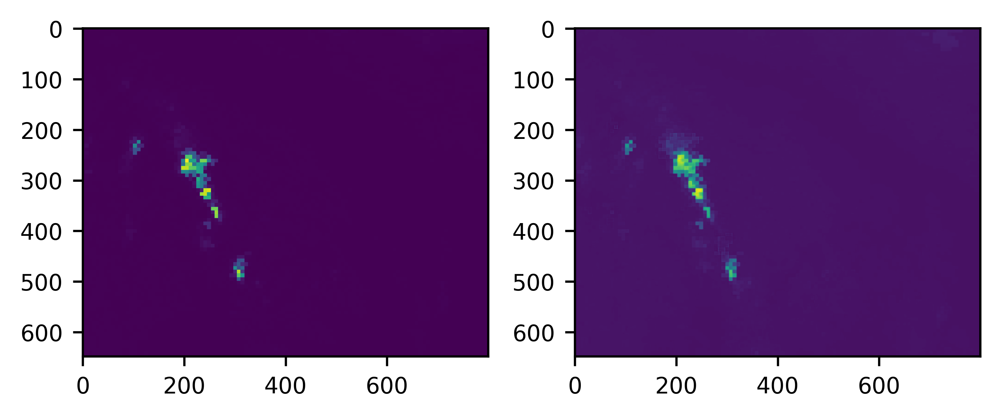

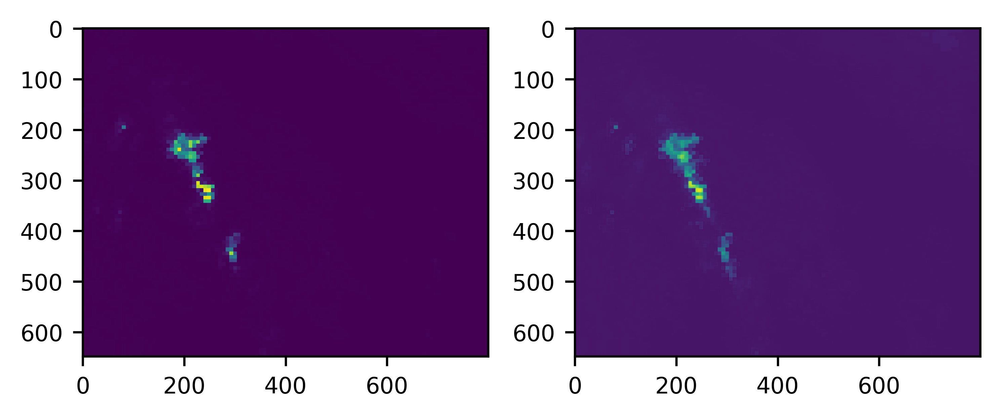

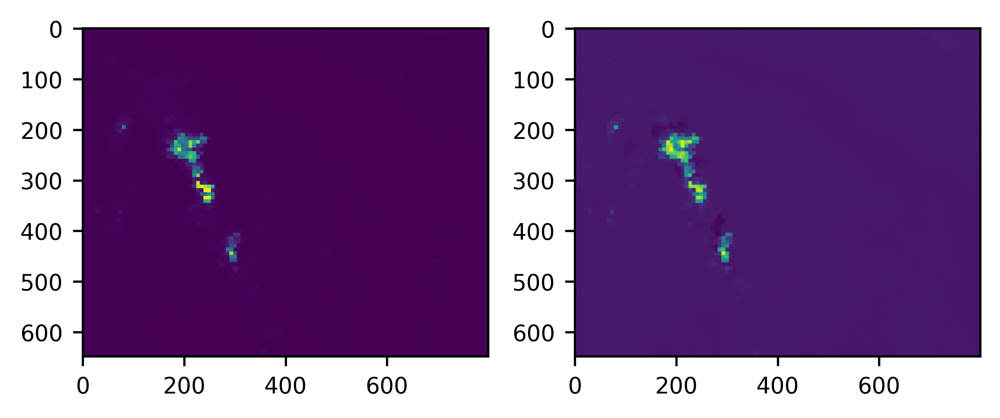

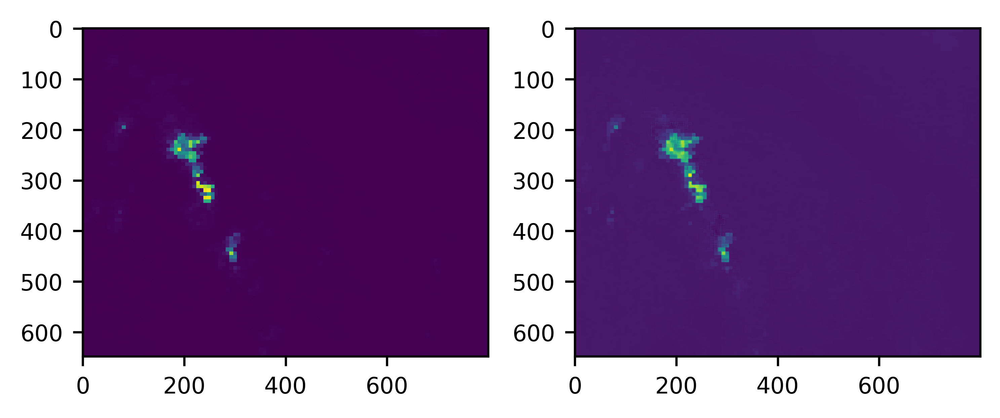

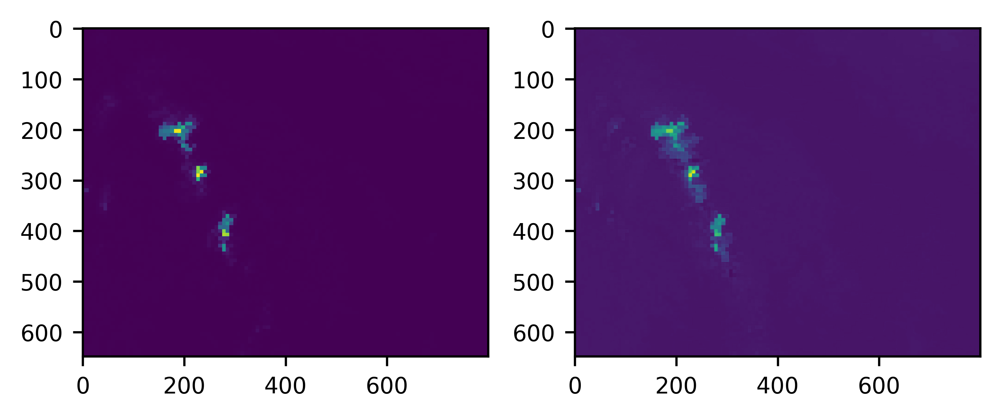

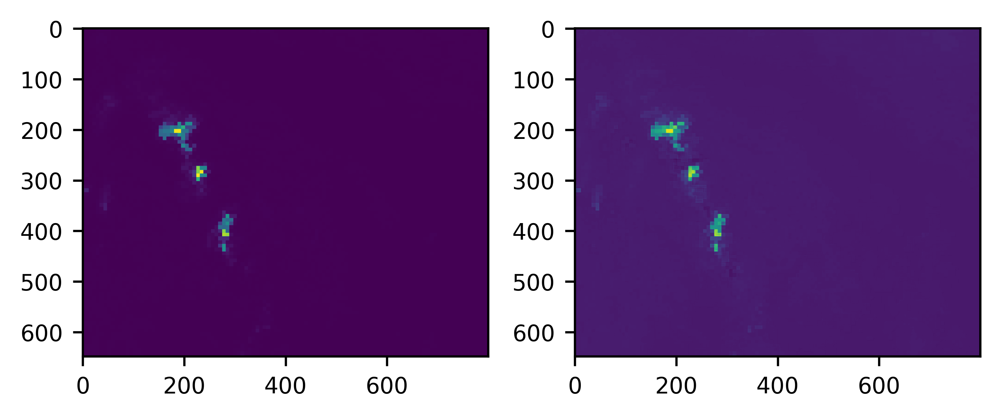

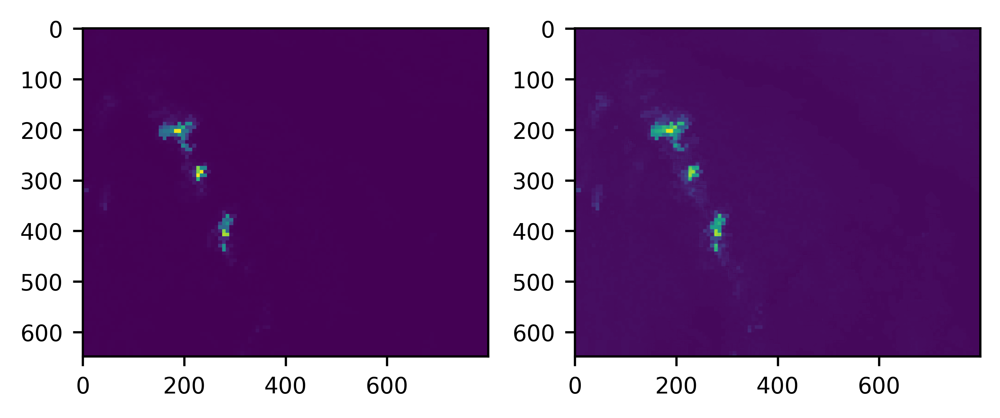

In [27]:

for i in range(10):
    fig,ax=plt.subplots(1,2,figsize=(5,5))
    axes= ax[0].imshow(after.numpy().squeeze()[i])
#     plt.colorbar(mappable=axes)
#     to_be_predicted= before_process.view(1,10,648,800).cuda()
#     pred= model(to_be_predicted).detach().cpu()
    axes= ax[1].imshow(output.squeeze()[i])
#     before_process[0:-1,:,:]= before_process[1:,:,:].clone()
#     before_process[-1]=pred    
    
    plt.tight_layout()
    fig.savefig('radarimages/%s-%d'%(date, i))

In [13]:
output.shape

(1, 10, 1, 648, 800)

In [11]:
sample=output.squeeze()[-1]
sample= 10**(sample*4)

/home/allen/Documents/Programs/miniconda3/envs/dl/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
